In [34]:
# general
import os
BASE_DIR = os.path.dirname(os.path.realpath('__file__'))

from pathlib import Path

import warnings

# computation
import math
import numpy as np
import pandas as pd
import geoglows
from scipy import interpolate

# plotting
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# import plotly.offline as pyo
# pyo.init_notebook_mode()

In [35]:
stations = ['Neak_Luong', 'Stung_Treng', 'Chaktomuk', 'Kompong_Kdei', 'Prek_Kdam', 'Kg._Thmar',
            'Koh_Khel', 'Lumphat', 'Kompong_Cham', 'Phnom_Penh_Port', 'Voeun_Sai', 'Kratie', 
            'Kompong_Chen', 'Kompong_Cham', 'Sisophon'
           ]
# 'Kompong_Thom', 'Battambang', 'Siempang'

In [36]:
Path(f'{BASE_DIR}/spt_vs_mrc/').mkdir(parents=True, exist_ok=True)

dfs_obs = []
dfs_pred = []
dfs = []

for station in stations:
    obs = pd.read_csv(f'{BASE_DIR}/mrc_observations/{station}.csv')
    obs['datetime'] = pd.to_datetime(obs['datetime'])
    obs = obs.set_index('datetime')
#     dfs_obs.append({'station': station, 'df': obs})

    pred = pd.read_csv(f'{BASE_DIR}/spt_predictions/{station}.csv')
    pred['datetime'] = pd.to_datetime(pred['datetime'])
    pred = pred.set_index('datetime')
#     dfs_pred.append({'station': station, 'df': pred})

    obs = obs.rename(columns={'discharge': 'observation'})
    pred = pred.rename(columns={'discharge': 'prediction'})
    df = pd.merge(obs, pred, how='inner', on='datetime')
#     df.sort_values(by=['datetime'], ascending=True, inplace=True)
    dfs.append({'station': station, 'df_obs': obs, 'df_pred': pred})
    

In [37]:
def correct_historical(simulated_data: pd.DataFrame, observed_data: pd.DataFrame) -> pd.DataFrame:
    """
    Accepts a historically simulated flow timeseries and observed flow timeseries and attempts to correct biases in the
    simulation on a monthly basis.
    Args:
        simulated_data: A dataframe with a datetime index and a single column of streamflow values
        observed_data: A dataframe with a datetime index and a single column of streamflow values
    Returns:
        pandas DataFrame with a datetime index and a single column of streamflow values
    """
    # list of the unique months in the historical simulation. should always be 1->12 but just in case...
    unique_simulation_months = sorted(set(simulated_data.index.strftime('%m')))
    dates = []
    values = []

    for month in unique_simulation_months:
        # filter historic data to only be current month
        monthly_simulated = simulated_data[simulated_data.index.month == int(month)].dropna()
        to_prob = _flow_and_probability_mapper(monthly_simulated, to_probability=True)
        # filter the observations to current month
        monthly_observed = observed_data[observed_data.index.month == int(month)].dropna()
        to_flow = _flow_and_probability_mapper(monthly_observed, to_flow=True)

        dates += monthly_simulated.index.to_list()
        value = to_flow(to_prob(monthly_simulated.values))
        values += value.tolist()

    corrected = pd.DataFrame(data=values, index=dates, columns=['Corrected Simulated Streamflow'])
    corrected.sort_index(inplace=True)
    return corrected

In [38]:
def _flow_and_probability_mapper(monthly_data: pd.DataFrame, to_probability: bool = False,
                                 to_flow: bool = False, extrapolate: bool = False) -> interpolate.interp1d:
    if not to_flow and not to_probability:
        raise ValueError('You need to specify either to_probability or to_flow as True')

    # get maximum value to bound histogram
    max_val = math.ceil(np.max(monthly_data.max()))
    min_val = math.floor(np.min(monthly_data.min()))
    if max_val == min_val:
        warnings.warn('The observational data has the same max and min value. You may get unanticipated results.')
        max_val += .1

    # determine number of histograms bins needed
    number_of_points = len(monthly_data.values)
    number_of_classes = math.ceil(1 + (3.322 * math.log10(number_of_points)))

    # specify the bin width for histogram (in m3/s)
    step_width = (max_val - min_val) / number_of_classes

    # specify histogram bins
    bins = np.arange(-np.min(step_width), max_val + 2 * np.min(step_width), np.min(step_width))
    if bins[0] == 0:
        bins = np.concatenate((-bins[1], bins))
    elif bins[0] > 0:
        bins = np.concatenate((-bins[0], bins))

    # make the histogram
    counts, bin_edges = np.histogram(monthly_data, bins=bins)

    # adjust the bins to be the center
    bin_edges = bin_edges[1:]

    # normalize the histograms
    counts = counts.astype(float) / monthly_data.size

    # calculate the cdfs
    cdf = np.cumsum(counts)

    # interpolated function to convert simulated streamflow to prob
    if to_probability:
        if extrapolate:
            return interpolate.interp1d(bin_edges, cdf, fill_value='extrapolate')
        return interpolate.interp1d(bin_edges, cdf)
    # interpolated function to convert simulated prob to observed streamflow
    elif to_flow:
        if extrapolate:
            return interpolate.interp1d(cdf, bin_edges, fill_value='extrapolate')
        return interpolate.interp1d(cdf, bin_edges)

<ipython-input-38-e0e26f3a1ef1>:10: UserWarning:

The observational data has the same max and min value. You may get unanticipated results.

<ipython-input-38-e0e26f3a1ef1>:10: UserWarning:

The observational data has the same max and min value. You may get unanticipated results.

<ipython-input-38-e0e26f3a1ef1>:10: UserWarning:

The observational data has the same max and min value. You may get unanticipated results.



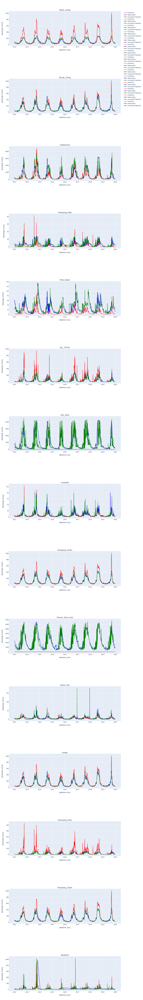

In [40]:
fig = make_subplots(rows=len(dfs), cols=1, start_cell='top-left', subplot_titles = [station['station'] for station in dfs])

for idx, station in enumerate(dfs):

    name = station['station']
    
    df_pred = station['df_pred']
    df_obs = station['df_obs']
#     bias_corrected = geoglows.bias.correct_historical(df_pred, df_obs)
    bias_corrected = correct_historical(df_pred, df_obs)

#   # webgl for fast render
    fig.add_trace(go.Scattergl(x=df_pred.index,
                               y=df_pred.prediction,
#                                name=f'{name} observed',
                               name=f'Prediction',
                               mode='lines',
                               line=dict(color='red'),
#                                showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)

    fig.add_trace(go.Scattergl(x=df_obs.index,
                               y=df_obs.observation,
                               mode='lines+text',
#                                name = f'{dfs_pred[idx]["station"]} predicted',
                               name = f'Observation',
                               line=dict(color='blue'),
#                                showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)
    
    fig.add_trace(go.Scattergl(x=bias_corrected.index,
                               y=bias_corrected['Corrected Simulated Streamflow'],
                               mode='lines+text',
#                                name = f'{dfs_pred[idx]["station"]} predicted',
                               name = f'Corrected Prediction',
                               line=dict(color='green'),
#                                showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)

    fig.update_xaxes(title_text='datetime (utc)', row=idx+1, col=1)
    fig.update_yaxes(title_text='discharge (m3/s)', row=idx+1, col=1)

fig.update_layout(height=len(dfs)*600, width=1000)
fig.show()